#Library

In [ ]:
!pip install opencv-python opencv-contrib-python numpy scipy scikit-learn

In [ ]:
!pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 21.0 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [ ]:
!pip install scikit-image

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import local_binary_pattern
from scipy.stats import skew, kurtosis, entropy
from sklearn.cluster import KMeans
import scipy.spatial.distance as dist
import os

# Persiapan Dataset

In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"raihanfasya","key":"414df0ef67c5f401ebbe10913341d7d6"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!pip install -q kaggle
!kaggle datasets download -d rm1000/lung-cancer-histopathological-images
!unzip -q lung-cancer-histopathological-images.zip -d lung_cancer_data

Dataset URL: https://www.kaggle.com/datasets/rm1000/lung-cancer-histopathological-images
License(s): CC-BY-SA-4.0


##Inisiasi path folder

In [ ]:
benign_path = 'lung_cancer_data/benign'
adenocarcinoma_path = 'lung_cancer_data/adenocarcinoma'
squamous_path = 'lung_cancer_data/squamous_cell_carcinoma'

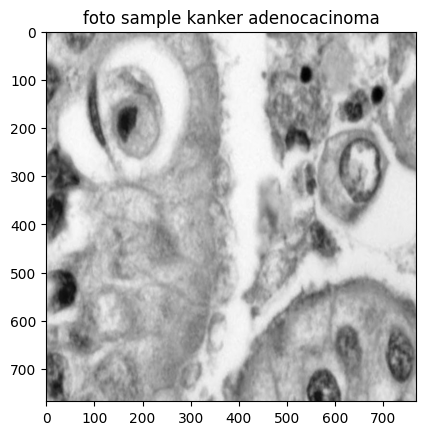

(768, 768)

In [ ]:
image = cv2.imread('lung_cancer_data/adenocarcinoma/0000.jpg', cv2.IMREAD_GRAYSCALE)
image = cv2.resize(image, (768,768), interpolation=cv2.INTER_LINEAR)
plt.title("foto sample kanker adenocacinoma")
plt.imshow(image, cmap='gray')
plt.show()
image.shape

#Pre processing

##Equalize

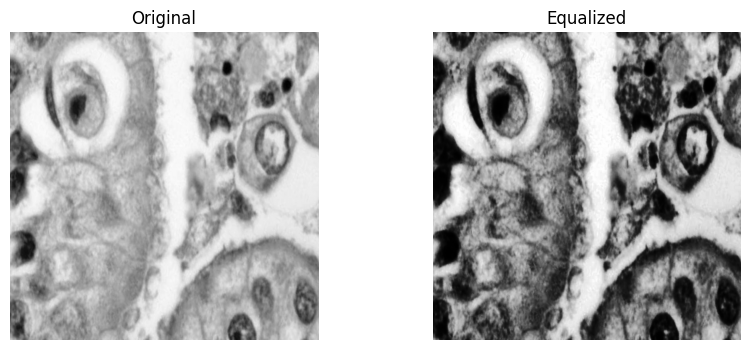

In [ ]:
img_eq = cv2.equalizeHist(image)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.axis("off")
plt.imshow(image, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Equalized")
plt.axis("off")
plt.imshow(img_eq, cmap="gray")

plt.show()

##Apply CLAHE (Contrast Limited Adaptive Histogram Equalization)

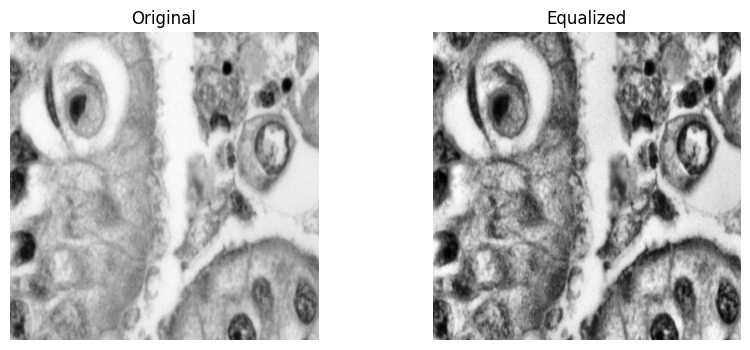

In [ ]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_eq = clahe.apply(image)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.title("Original")
plt.axis("off")
plt.imshow(image, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Equalized")
plt.axis("off")
plt.imshow(img_eq, cmap="gray")

plt.show()

##Gaussian filtering

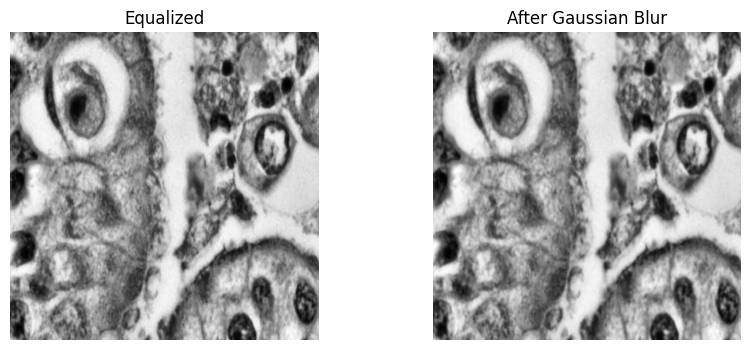

In [ ]:
ksize = (5, 5)
sigmaX = 0
image_gauss = cv2.GaussianBlur(img_eq, ksize, sigmaX)

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.title("Equalized")
plt.axis("off")
plt.imshow(img_eq, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("After Gaussian Blur")
plt.axis("off")
plt.imshow(image_gauss, cmap="gray")

plt.show()

#Ekstraksi Fitur (Coba)

##Sobel Filter

Minimum gradient: 0.0
Maximum gradient: 310.35785796399614
Average gradient: 43.315469620083405
Median gradient: 35.77708763999664
[np.float64(43.315469620083405), np.float64(33.71701456081086), np.float64(1.511380293842389), np.float64(3.4676430655301047)]


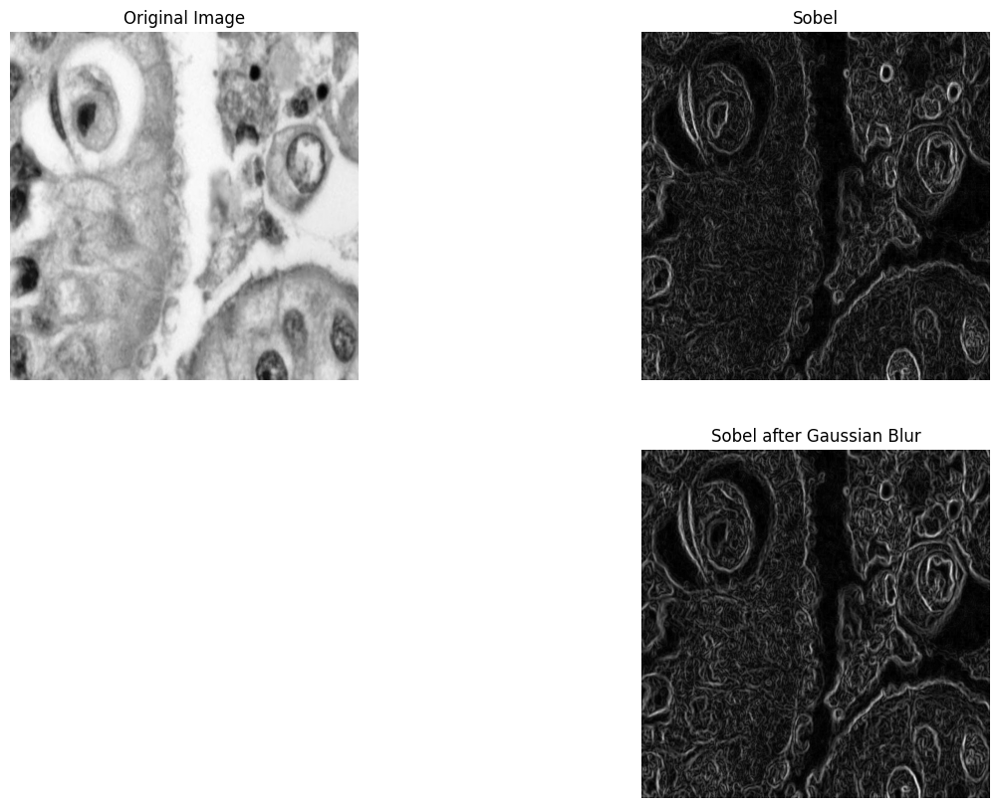

In [ ]:
sobel_x = cv2.Sobel(image, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(image, cv2.CV_64F, 0, 1, ksize=3)
sobel = np.sqrt(sobel_x**2 + sobel_y**2)

sobel_x_gauss = cv2.Sobel(image_gauss, cv2.CV_64F, 1, 0, ksize=3)
sobel_y_gauss = cv2.Sobel(image_gauss, cv2.CV_64F, 0, 1, ksize=3)
sobel_gauss = np.sqrt(sobel_x_gauss**2 + sobel_y_gauss**2)

features_sobel = []

print("Minimum gradient:", np.min(sobel_gauss))
print("Maximum gradient:", np.max(sobel_gauss))
print("Average gradient:", np.mean(sobel_gauss))
print("Median gradient:", np.median(sobel_gauss))

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Sobel')
plt.imshow(sobel, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Sobel after Gaussian Blur')
plt.imshow(sobel_gauss, cmap='gray')
plt.axis('off')

features_sobel.append(np.mean(sobel_gauss))
features_sobel.append(np.std(sobel_gauss))
features_sobel.append(skew(sobel_gauss.flatten()))
features_sobel.append(kurtosis(sobel_gauss.flatten()))
print(features_sobel)

##Prewitt Filter

(np.float64(-0.5), np.float64(767.5), np.float64(767.5), np.float64(-0.5))

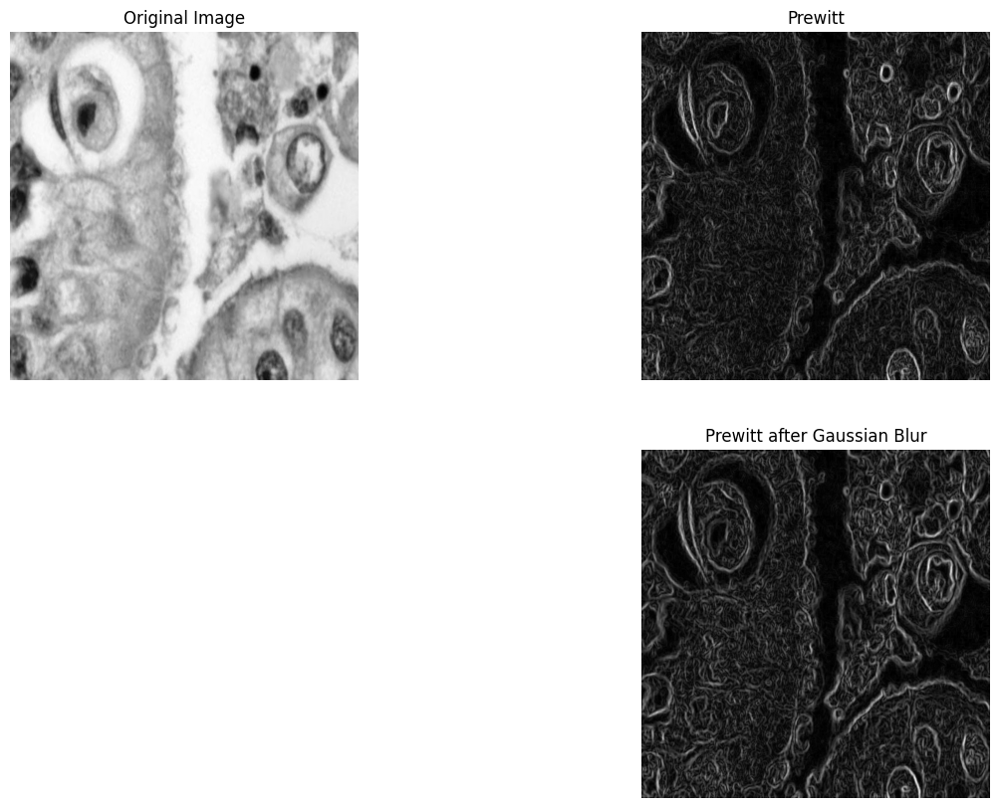

In [ ]:
prewitt_kernel_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
prewitt_kernel_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)

prewitt_x = cv2.filter2D(image, cv2.CV_64F, prewitt_kernel_x)
prewitt_y = cv2.filter2D(image, cv2.CV_64F, prewitt_kernel_y)
prewitt = np.sqrt(prewitt_x**2 + prewitt_y**2)

prewitt_x_gauss = cv2.filter2D(image_gauss, cv2.CV_64F, prewitt_kernel_x)
prewitt_y_gauss = cv2.filter2D(image_gauss, cv2.CV_64F, prewitt_kernel_y)
prewitt_gauss = np.sqrt(prewitt_x_gauss**2 + prewitt_y_gauss**2)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Prewitt')
plt.imshow(prewitt, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Prewitt after Gaussian Blur')
plt.imshow(prewitt_gauss, cmap='gray')
plt.axis('off')

##Roberts Filter

(np.float64(-0.5), np.float64(767.5), np.float64(767.5), np.float64(-0.5))

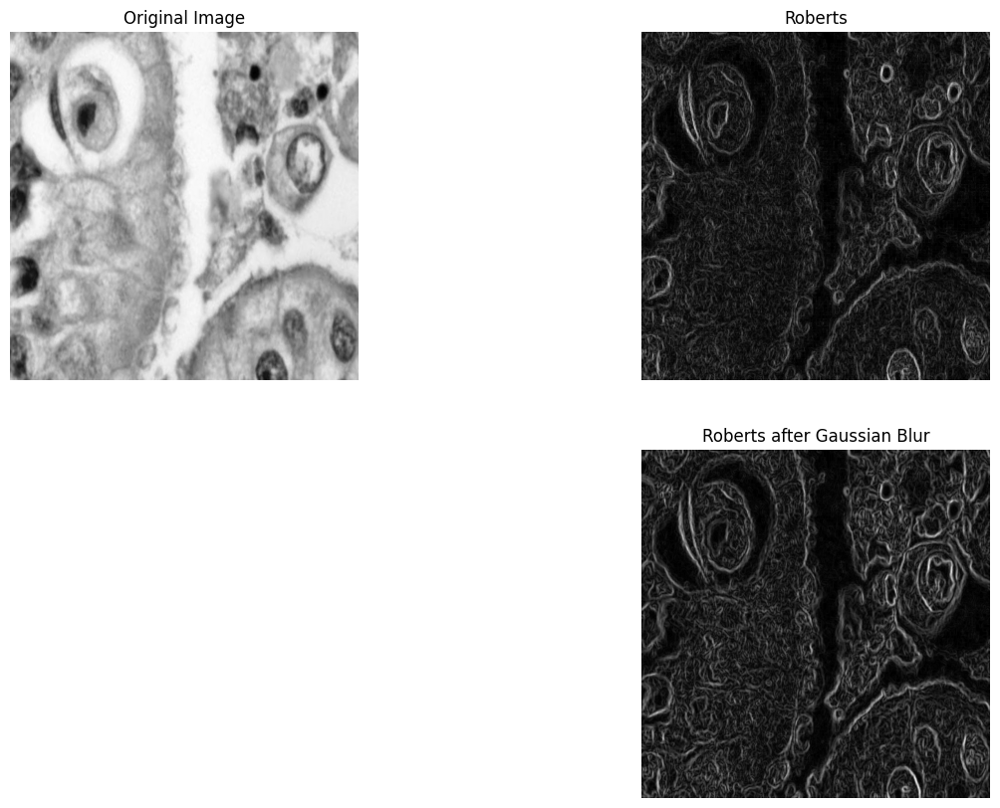

In [ ]:
roberts_kernel_1 = np.array([[1, 0], [0, -1]], dtype=np.float32)
roberts_kernel_2 = np.array([[0, 1], [-1, 0]], dtype=np.float32)

roberts_1 = cv2.filter2D(image, cv2.CV_64F, roberts_kernel_1)
roberts_2 = cv2.filter2D(image, cv2.CV_64F, roberts_kernel_2)
roberts = np.sqrt(roberts_1**2 + roberts_2**2)

roberts_1_gauss = cv2.filter2D(image_gauss, cv2.CV_64F, roberts_kernel_1)
roberts_2_gauss = cv2.filter2D(image_gauss, cv2.CV_64F, roberts_kernel_2)
roberts_gauss = np.sqrt(roberts_1_gauss**2 + roberts_2_gauss**2)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Roberts')
plt.imshow(roberts, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Roberts after Gaussian Blur')
plt.imshow(roberts_gauss, cmap='gray')
plt.axis('off')

##Canny Edge Detection

[np.float64(0.1359897189670139), 143350.5120613575, 4093, np.float64(7.585940342878316)]


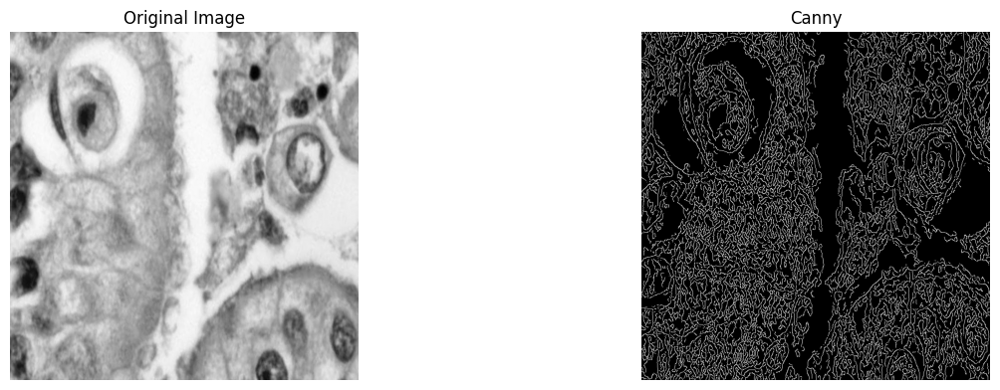

In [ ]:
low_threshold = 19
high_threshold = 57
canny = cv2.Canny(image_gauss, low_threshold, high_threshold)

plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Canny')
plt.imshow(canny, cmap='gray')
plt.axis('off')

features_canny = []

density = np.sum(canny > 0) / image.size
features_canny.append(density)

contours, _ = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
total_length = sum(cv2.arcLength(cnt, True) for cnt in contours)
features_canny.append(total_length)
features_canny.append(len(contours))

tortuosity = []
for cnt in contours:
    area = cv2.contourArea(cnt)
    if area > 10:
        perimeter = cv2.arcLength(cnt, True)
        if area > 0:
            tortuosity.append(perimeter / area)
features_canny.append(np.mean(tortuosity) if tortuosity else 0)

print(features_canny)


##Corner detection using Harris method

(np.float64(-0.5), np.float64(767.5), np.float64(767.5), np.float64(-0.5))

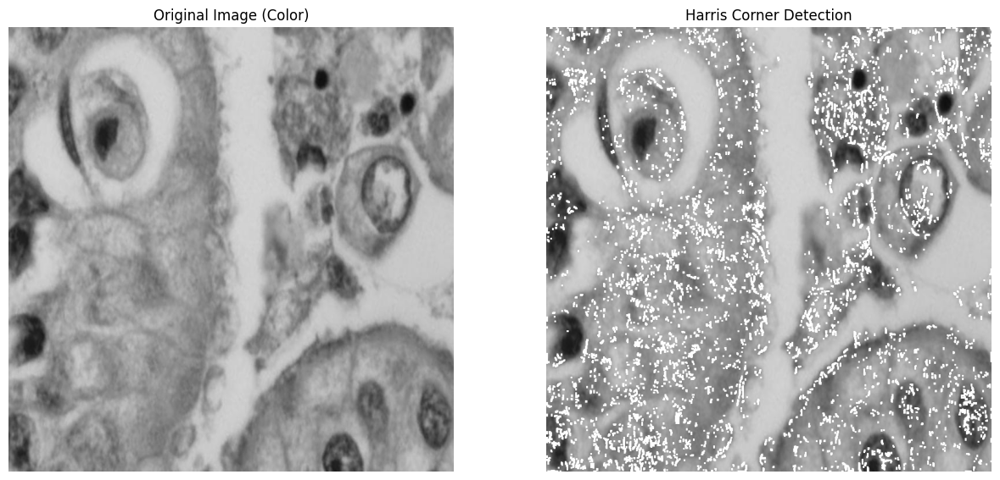

In [ ]:
harris = cv2.cornerHarris(image_gauss, blockSize=2, ksize=3, k=0.04)

harris = cv2.dilate(harris, None)
harris_image = image.copy()
harris_image[harris > 0.01 * harris.max()] = 255

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.title('Original Image (Color)')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Harris Corner Detection')
plt.imshow(cv2.cvtColor(harris_image, cv2.COLOR_BGR2RGB))
plt.axis('off')

##Shi-Tomasi Corner Detection

[100, 0.00016954210069444444, np.float64(395.1091433432458), np.float64(98072.34199999999)]


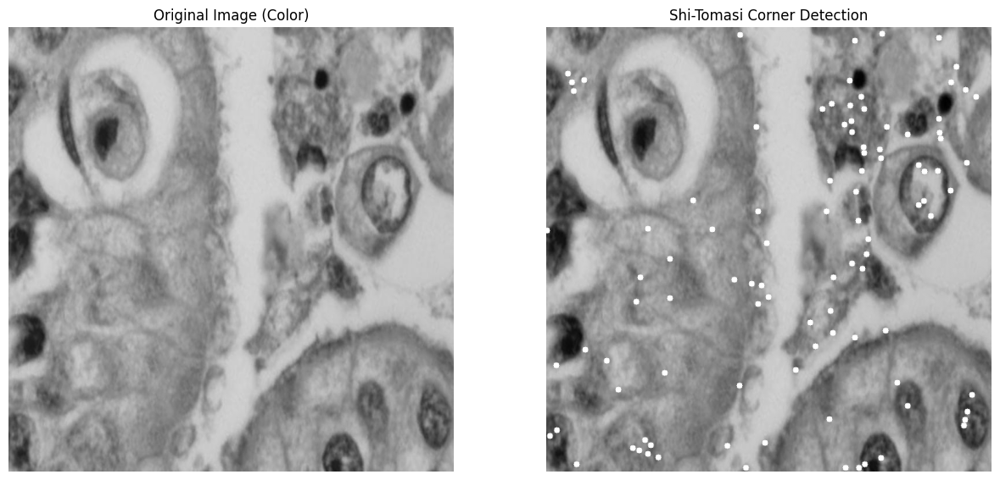

In [ ]:
corners = cv2.goodFeaturesToTrack(image_gauss, maxCorners=100, qualityLevel=0.01, minDistance=10)
shi_tomasi_image = image.copy()
if corners is not None:
    corners = np.int64(corners)
    for corner in corners:
        x, y = corner.ravel()
        cv2.circle(shi_tomasi_image, (x, y), 5, 255, -1)

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.title('Original Image (Color)')
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Shi-Tomasi Corner Detection')
plt.imshow(shi_tomasi_image, cmap='gray')
plt.axis('off')

features_shi = []

n_corners = len(corners) if corners is not None else 0
features_shi.append(n_corners)
features_shi.append(n_corners / (image.shape[0] * image.shape[1]))

if corners is not None and len(corners) > 1:
    corners = corners.reshape(-1, 2)
    distances = dist.pdist(corners)
    features_shi.append(np.mean(distances))
    features_shi.append(np.var(corners[:, 0]) + np.var(corners[:, 1]))
else:
    features_shi.extend([0, 0])

print(features_shi)

##SIFT Keypoints Detection

[500, 0.0008477105034722222]


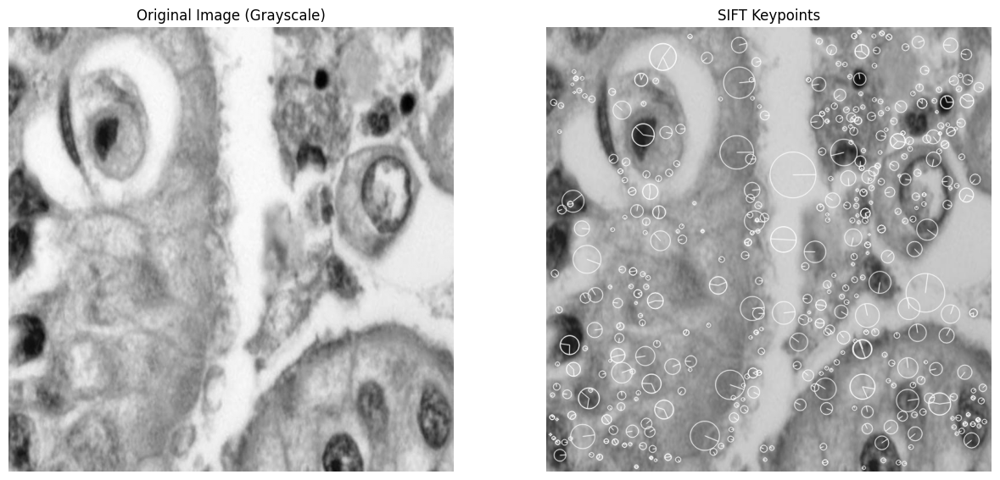

In [ ]:
sift = cv2.SIFT_create(nfeatures=500)
keypoints, descriptors = sift.detectAndCompute(image_gauss, None)
sift_image = cv2.drawKeypoints(image, keypoints, None, color=(255, 255, 255),
                               flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(15, 15))

plt.subplot(2, 2, 1)
plt.title('Original Image (Grayscale)')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('SIFT Keypoints')
plt.imshow(sift_image, cmap='gray')
plt.axis('off')

features_sift = []
n_keypoints = len(keypoints) if keypoints else 0
features_sift.append(n_keypoints)
features_sift.append(n_keypoints / (image.shape[0] * image.shape[1]))
print(features_sift)


##Thresholding

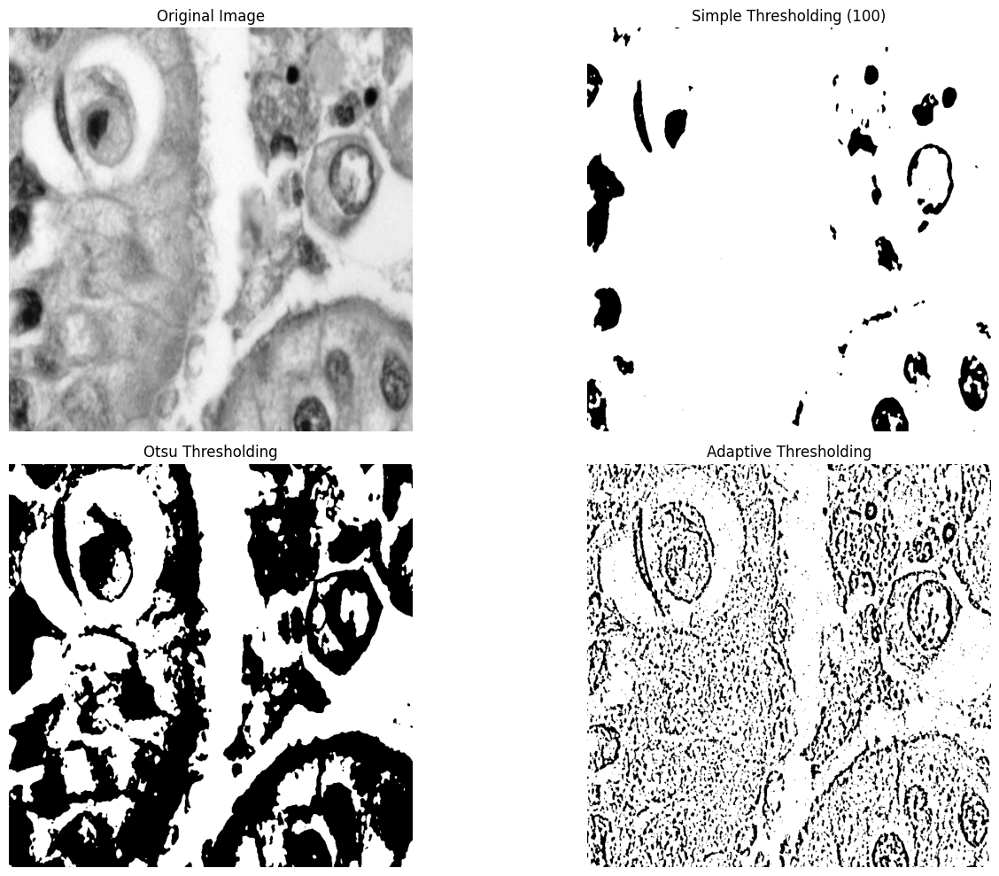

In [ ]:
image_gaussian = cv2.GaussianBlur(image, (5, 5), 0)
_, thresh_simple = cv2.threshold(image_gaussian, 100, 255, cv2.THRESH_BINARY)
_, thresh_otsu = cv2.threshold(image_gaussian, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
thresh_adaptive = cv2.adaptiveThreshold(image_gaussian, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                       cv2.THRESH_BINARY, blockSize=11, C=2)

plt.figure(figsize=(15, 10))
plt.subplot(2, 2, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.title('Simple Thresholding (100)')
plt.imshow(thresh_simple, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.title('Otsu Thresholding')
plt.imshow(thresh_otsu, cmap='gray')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.title('Adaptive Thresholding')
plt.imshow(thresh_adaptive, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

##K-Means

Cluster 0 saved to output_kmeans_clusters/cluster_0_0000.jpg
Cluster 1 saved to output_kmeans_clusters/cluster_1_0000.jpg
Cluster 2 saved to output_kmeans_clusters/cluster_2_0000.jpg
Cluster 0 - Proportion: 0.3482
Cluster 1 - Proportion: 0.1225
Cluster 2 - Proportion: 0.5294
Cluster 0 - Mean intensity: 191.5650
Cluster 1 - Mean intensity: 90.1466
Cluster 2 - Mean intensity: 145.4068
Cluster 0 - Variance: 171.0588
Cluster 1 - Variance: 538.9458
Cluster 2 - Variance: 187.2100
Cluster 0 - Number of regions: 180
Cluster 0 - Mean area: 1915.6767
Cluster 0 - Mean circularity: 0.5203
Cluster 0 - Mean perimeter: 137.8334
Cluster 0 - Mean elongation: 2.0430
Cluster 0 - Spatial density: 0.000305
Cluster 1 - Number of regions: 162
Cluster 1 - Mean area: 621.6560
Cluster 1 - Mean circularity: 0.5388
Cluster 1 - Mean perimeter: 98.6860
Cluster 1 - Mean elongation: 2.1931
Cluster 1 - Spatial density: 0.000275
Cluster 2 - Number of regions: 65
Cluster 2 - Mean area: 18740.7609
Cluster 2 - Mean circul

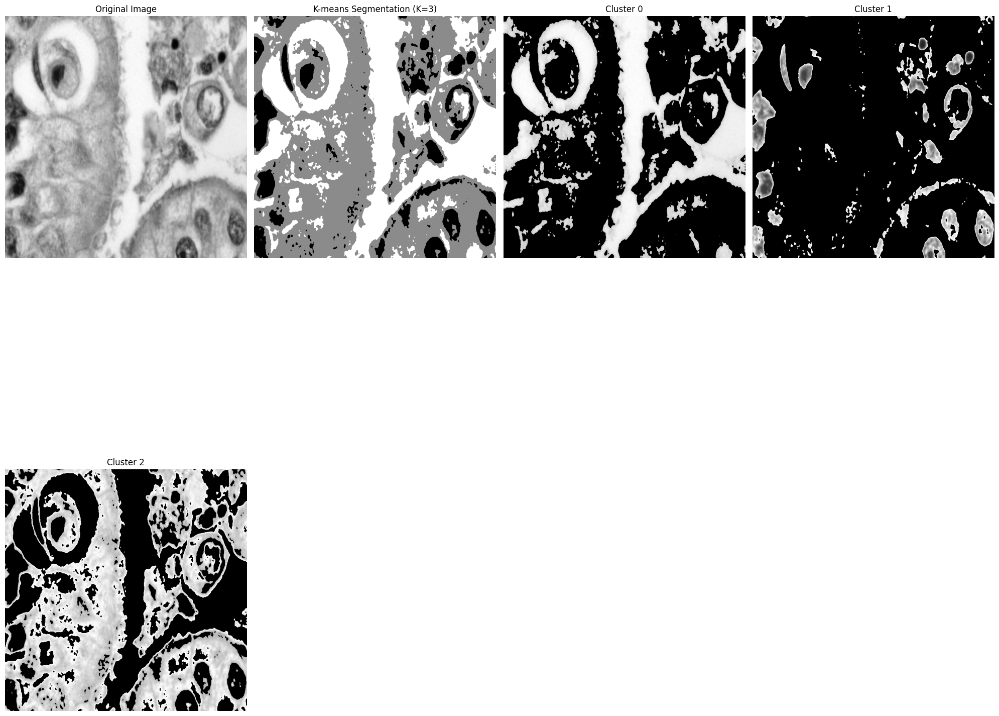

In [ ]:
image_path = 'lung_cancer_data/adenocarcinoma/0000.jpg'
output_folder = "output_kmeans_clusters/"

if not os.path.exists(output_folder):
    os.makedirs(output_folder)

image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
if image is None:
    raise ValueError(f"Unable to load the image: {image_path}")

image_gaussian = cv2.GaussianBlur(image, (5, 5), 0)

K = 3
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

pixels = image_gaussian.reshape(-1, 1).astype(np.float32)

_, labels, centers = cv2.kmeans(pixels, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

centers = np.uint8(centers)
segmented_kmeans = centers[labels.flatten()]
segmented_kmeans = segmented_kmeans.reshape(image.shape)

cluster_images = []
for k in range(K):
    mask = (labels.flatten() == k).reshape(image.shape)
    cluster_image = np.zeros_like(image)
    cluster_image[mask] = image_gaussian[mask]
    cluster_images.append(cluster_image)

    output_path = os.path.join(output_folder, f"cluster_{k}_{os.path.basename(image_path)}")
    cv2.imwrite(output_path, cluster_image)
    print(f"Cluster {k} saved to {output_path}")

features_kmean = []

for k in range(K):
    proportion = np.sum(labels.flatten() == k) / len(labels)
    features_kmean.append(proportion)
    print(f"Cluster {k} - Proportion: {proportion:.4f}")

for k in range(K):
    mask = (labels.flatten() == k)
    if np.sum(mask) > 0:
        mean_intensity = np.mean(pixels[mask])
        features_kmean.append(mean_intensity)
        print(f"Cluster {k} - Mean intensity: {mean_intensity:.4f}")
    else:
        features_kmean.append(0)
        print(f"Cluster {k} - Mean intensity: 0 (empty cluster)")

for k in range(K):
    mask = (labels.flatten() == k)
    if np.sum(mask) > 0:
        variance = np.var(pixels[mask])
        features_kmean.append(variance)
        print(f"Cluster {k} - Variance: {variance:.4f}")
    else:
        features_kmean.append(0)
        print(f"Cluster {k} - Variance: 0 (empty cluster)")

for k in range(K):
    cluster_img = (labels.flatten() == k).reshape(image.shape).astype(np.uint8) * 255

    num_labels, _, stats, _ = cv2.connectedComponentsWithStats(cluster_img, connectivity=8)
    n_regions = num_labels - 1
    features_kmean.append(n_regions)
    print(f"Cluster {k} - Number of regions: {n_regions}")

    contours, _ = cv2.findContours(cluster_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    areas, circularities, perimeters, elongations = [], [], [], []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 10:
            areas.append(area)
            perimeter = cv2.arcLength(cnt, True)
            perimeters.append(perimeter)
            if perimeter > 0:
                circularity = 4 * np.pi * area / (perimeter ** 2)
                circularities.append(circularity)
            rect = cv2.minAreaRect(cnt)
            width, height = rect[1]
            if min(width, height) > 0:
                elongation = max(width, height) / min(width, height)
                elongations.append(elongation)

    features_kmean.append(np.mean(areas) if areas else 0)
    print(f"Cluster {k} - Mean area: {features_kmean[-1]:.4f}")

    features_kmean.append(np.mean(circularities) if circularities else 0)
    print(f"Cluster {k} - Mean circularity: {features_kmean[-1]:.4f}")

    features_kmean.append(np.mean(perimeters) if perimeters else 0)
    print(f"Cluster {k} - Mean perimeter: {features_kmean[-1]:.4f}")

    features_kmean.append(np.mean(elongations) if elongations else 0)
    print(f"Cluster {k} - Mean elongation: {features_kmean[-1]:.4f}")

    density = n_regions / (image.shape[0] * image.shape[1])
    features_kmean.append(density)
    print(f"Cluster {k} - Spatial density: {density:.6f}")

features_kmean = np.array(features_kmean)
print(f"\nTotal number of features extracted: {len(features_kmean)}")
print(f"Features: {features_kmean}")

output_features_path = os.path.join(output_folder, f"features_kmeans_{os.path.basename(image_path)}.npy")
np.save(output_features_path, features_kmean)
print(f"Features saved to: {output_features_path}")

plt.figure(figsize=(20, 20))

plt.subplot(2, K+1, 1)
plt.title('Original Image')
plt.imshow(image, cmap='gray')
plt.axis('off')

plt.subplot(2, K+1, 2)
plt.title(f'K-means Segmentation (K={K})')
plt.imshow(segmented_kmeans, cmap='gray')
plt.axis('off')

for k in range(K):
    plt.subplot(2, K+1, k+3)
    plt.title(f'Cluster {k}')
    plt.imshow(cluster_images[k], cmap='gray')
    plt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
print("Features from Canny Edge Detection:")
print(features_canny)

print("Features from Sobel Edge Detection:")
print(features_sobel)

print("Features from Shi-Tomasi Corner Detection:")
print(features_shi)

print("Features from K-means Clustering:")
print(features_kmean)

Features from Canny Edge Detection:
[np.float64(0.1359897189670139), 143350.5120613575, 4093, np.float64(7.585940342878316)]
Features from Sobel Edge Detection:
[np.float64(43.315469620083405), np.float64(33.71701456081086), np.float64(1.511380293842389), np.float64(3.4676430655301047)]
Features from Shi-Tomasi Corner Detection:
[100, 0.00016954210069444444, np.float64(395.1091433432458), np.float64(98072.34199999999)]
Features from K-means Clustering:
[3.48185221e-01 1.22456868e-01 5.29357910e-01 1.91565018e+02
 9.01465607e+01 1.45406845e+02 1.71058777e+02 5.38945801e+02
 1.87209991e+02 1.80000000e+02 1.91567672e+03 5.20250298e-01
 1.37833386e+02 2.04298011e+00 3.05175781e-04 1.62000000e+02
 6.21655963e+02 5.38843788e-01 9.86859602e+01 2.19312734e+00
 2.74658203e-04 6.50000000e+01 1.87407609e+04 5.09712606e-01
 4.62163497e+02 1.79197010e+00 1.10202365e-04]


Ringkasan Fitur yang Diekstraksi:

features_canny: Fitur yang diekstrak setelah menggunakan deteksi tepi Canny, seperti kepadatan tepi, panjang tepi, atau fitur lain yang terkait dengan tepi.

features_sobel: Fitur setelah menggunakan deteksi tepi Sobel, termasuk besar gradien dan arahnya, atau karakteristik tepi lainnya.

features_shi: Fitur yang diekstrak dengan algoritma deteksi sudut Shi-Tomasi, yang mungkin meliputi jumlah sudut yang terdeteksi, posisi sudut, atau ukuran kepadatan sudut.

features_kmean: Fitur dari klasterisasi K-means, seperti proporsi klaster, intensitas, variansi, dan sifat morfologi seperti area, circularitas, perimeter, dll.

#Ekstraksi Fitur (FIX)

In [ ]:
def sobel_features(image_gauss):
    sobel_x_gauss = cv2.Sobel(image_gauss, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y_gauss = cv2.Sobel(image_gauss, cv2.CV_64F, 0, 1, ksize=3)
    sobel_gauss = np.sqrt(sobel_x_gauss**2 + sobel_y_gauss**2)

    features_sobel = []

    features_sobel.append(np.mean(sobel_gauss))
    features_sobel.append(np.std(sobel_gauss))
    features_sobel.append(skew(sobel_gauss.flatten()))
    features_sobel.append(kurtosis(sobel_gauss.flatten()))
    return features_sobel

In [ ]:
def canny_features(image_gauss):

    low_threshold = 19
    high_threshold = 57
    canny = cv2.Canny(image_gauss, low_threshold, high_threshold)

    features_canny = []

    density = np.sum(canny > 0) / image.size
    features_canny.append(density)

    contours, _ = cv2.findContours(canny, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    total_length = sum(cv2.arcLength(cnt, True) for cnt in contours)
    features_canny.append(total_length)
    features_canny.append(len(contours))
    tortuosity = []

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area > 10:
            perimeter = cv2.arcLength(cnt, True)
            if area > 0:
                tortuosity.append(perimeter / area)
    features_canny.append(np.mean(tortuosity) if tortuosity else 0)
    return features_canny


In [ ]:
def shi_tomasi_features(image_gauss):
    corners = cv2.goodFeaturesToTrack(image_gauss, maxCorners=100, qualityLevel=0.01, minDistance=10)
    shi_tomasi_image = image.copy()
    if corners is not None:
        corners = np.int64(corners)
        for corner in corners:
            x, y = corner.ravel()
            cv2.circle(shi_tomasi_image, (x, y), 5, 255, -1)

    features_shi = []

    n_corners = len(corners) if corners is not None else 0
    features_shi.append(n_corners)
    features_shi.append(n_corners / (image.shape[0] * image.shape[1]))

    if corners is not None and len(corners) > 1:
        corners = corners.reshape(-1, 2)
        distances = dist.pdist(corners)
        features_shi.append(np.mean(distances))
        features_shi.append(np.var(corners[:, 0]) + np.var(corners[:, 1]))
    else:
        features_shi.extend([0, 0])

    return features_shi


In [ ]:
def sift(image_gauss):
    sift = cv2.SIFT_create(nfeatures=500)
    keypoints, descriptors = sift.detectAndCompute(image_gauss, None)
    sift_image = cv2.drawKeypoints(image, keypoints, None, color=(255, 255, 255),
                                  flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    features_sift = []
    n_keypoints = len(keypoints) if keypoints else 0
    features_sift.append(n_keypoints)
    features_sift.append(n_keypoints / (image.shape[0] * image.shape[1]))
    return features_sift


In [ ]:
def kmean(image_gauss, image):

    output_folder = "output_kmeans_clusters/"

    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    K = 3
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

    pixels = image_gauss.reshape(-1, 1).astype(np.float32)

    _, labels, centers = cv2.kmeans(pixels, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

    centers = np.uint8(centers)
    segmented_kmeans = centers[labels.flatten()]
    segmented_kmeans = segmented_kmeans.reshape(image.shape)

    cluster_images = []
    for k in range(K):
        mask = (labels.flatten() == k).reshape(image.shape)
        cluster_image = np.zeros_like(image)
        cluster_image[mask] = image_gauss[mask]
        cluster_images.append(cluster_image)

        output_path = os.path.join(output_folder, f"cluster_{k}_{os.path.basename(image_path)}")
        cv2.imwrite(output_path, cluster_image)

    features_kmean = []

    for k in range(K):
        proportion = np.sum(labels.flatten() == k) / len(labels)
        features_kmean.append(proportion)

    for k in range(K):
        mask = (labels.flatten() == k)
        if np.sum(mask) > 0:
            mean_intensity = np.mean(pixels[mask])
            features_kmean.append(mean_intensity)
        else:
            features_kmean.append(0)

    for k in range(K):
        mask = (labels.flatten() == k)
        if np.sum(mask) > 0:
            variance = np.var(pixels[mask])
            features_kmean.append(variance)
        else:
            features_kmean.append(0)

    for k in range(K):
        cluster_img = (labels.flatten() == k).reshape(image.shape).astype(np.uint8) * 255

        num_labels, _, stats, _ = cv2.connectedComponentsWithStats(cluster_img, connectivity=8)
        n_regions = num_labels - 1
        features_kmean.append(n_regions)

        contours, _ = cv2.findContours(cluster_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        areas, circularities, perimeters, elongations = [], [], [], []

        for cnt in contours:
            area = cv2.contourArea(cnt)
            if area > 10:
                areas.append(area)
                perimeter = cv2.arcLength(cnt, True)
                perimeters.append(perimeter)
                if perimeter > 0:
                    circularity = 4 * np.pi * area / (perimeter ** 2)
                    circularities.append(circularity)
                rect = cv2.minAreaRect(cnt)
                width, height = rect[1]
                if min(width, height) > 0:
                    elongation = max(width, height) / min(width, height)
                    elongations.append(elongation)

        features_kmean.append(np.mean(areas) if areas else 0)

        features_kmean.append(np.mean(circularities) if circularities else 0)

        features_kmean.append(np.mean(perimeters) if perimeters else 0)

        features_kmean.append(np.mean(elongations) if elongations else 0)

        density = n_regions / (image.shape[0] * image.shape[1])
        features_kmean.append(density)

    features_kmean = np.array(features_kmean)

    return features_kmean

#Data Organization

Data Organization adalah proses menyusun dan merapikan data yang telah diekstraksi agar siap digunakan dalam proses modeling

##Buat Dataframe dengan 100 gambar

###Benign

In [ ]:
from PIL import Image
import cv2

benign_path = 'lung_cancer_data/benign'

print("Does the folder exist:", os.path.exists(benign_path))
print("Contents:", os.listdir(benign_path)[:5])

for i, image_name in enumerate(os.listdir(benign_path)):
    if i >= 600:
        break

    image_path = os.path.join(benign_path, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (768, 768), interpolation=cv2.INTER_LINEAR)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image = clahe.apply(image)

    ksize = (7, 7)
    sigmaX = 0
    image_gauss = cv2.GaussianBlur(image, ksize, sigmaX)
    img_norm = (image_gauss.astype(np.float32) - image_gauss.mean()) / image_gauss.std()

    features_sobel = sobel_features(img_norm)
    features_canny = canny_features(image_gauss)
    features_shi = shi_tomasi_features(image_gauss)
    features_kmean = kmean(img_norm, image)

    row = [int(2)] + list(features_sobel) + list(features_shi) + list(features_sift) + list(features_kmean)

    df.loc[len(df)] = row

print('done')

Does the folder exist: True
Contents: ['2258.jpg', '3810.jpg', '1732.jpg', '4108.jpg', '0248.jpg']
done


###Adenocarcinoma

In [ ]:
from PIL import Image
import cv2

adenocarcinoma_path = 'lung_cancer_data/adenocarcinoma'

print("Does the folder exist:", os.path.exists(adenocarcinoma_path))
print("Contents:", os.listdir(adenocarcinoma_path)[:5])

for i, image_name in enumerate(os.listdir(adenocarcinoma_path)):
    if i >= 600:
        break

    image_path = os.path.join(adenocarcinoma_path, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (768, 768), interpolation=cv2.INTER_LINEAR)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image = clahe.apply(image)

    ksize = (7, 7)
    sigmaX = 0
    image_gauss = cv2.GaussianBlur(image, ksize, sigmaX)
    img_norm = (image_gauss.astype(np.float32) - image_gauss.mean()) / image_gauss.std()

    features_sobel = sobel_features(img_norm)
    features_canny = canny_features(image_gauss)
    features_shi = shi_tomasi_features(image_gauss)
    features_kmean = kmean(img_norm, image)

    row = [int(1)] + list(features_sobel) + list(features_shi) + list(features_sift) + list(features_kmean)

    df.loc[len(df)] = row

print('done')


Does the folder exist: True
Contents: ['2258.jpg', '3810.jpg', '1732.jpg', '4108.jpg', '0248.jpg']
done


###Carcinoma

In [ ]:
from PIL import Image
import cv2

squamous_cell_carcinoma_path = 'lung_cancer_data/squamous_cell_carcinoma'

print("Does the folder exist:", os.path.exists(squamous_cell_carcinoma_path))
print("Contents:", os.listdir(squamous_cell_carcinoma_path)[:5])

for i, image_name in enumerate(os.listdir(squamous_cell_carcinoma_path)):
    if i >= 600:
        break

    image_path = os.path.join(squamous_cell_carcinoma_path, image_name)
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    image = cv2.resize(image, (768, 768), interpolation=cv2.INTER_LINEAR)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    image = clahe.apply(image)

    ksize = (7, 7)
    sigmaX = 0
    image_gauss = cv2.GaussianBlur(image, ksize, sigmaX)

    img_norm = (image_gauss.astype(np.float32) - image_gauss.mean()) / image_gauss.std()

    features_sobel = sobel_features(img_norm)
    features_canny = canny_features(image_gauss)
    features_shi = shi_tomasi_features(image_gauss)
    features_kmean = kmean(img_norm, image)

    row = [int(3)] + list(features_sobel) + list(features_shi) + list(features_sift) + list(features_kmean)

    df.loc[len(df)] = row

print('done')

Does the folder exist: True
Contents: ['2258.jpg', '3810.jpg', '1732.jpg', '4108.jpg', '0248.jpg']
done


##Buat Kolom dan DF

In [ ]:
import pandas as pd

columns = [
    'type', 'mean_sobel', 'std_sobel', 'skew_sobel', 'kurtosis_sobel',
    'n_corners_shi', 'corner_density_shi', 'mean_dist_shi', 'var_corners_shi',
    'n_points_sift', 'point_density_sift',
    'Cluster 0 - Proportion', 'Cluster 1 - Proportion', 'Cluster 2 - Proportion',
    'Cluster 0 - Mean Intensity', 'Cluster 1 - Mean Intensity', 'Cluster 2 - Mean Intensity',
    'Cluster 0 - Variance', 'Cluster 1 - Variance', 'Cluster 2 - Variance',
    'Cluster 0 - Number of Regions', 'Cluster 0 - Mean Area', 'Cluster 0 - Mean Circularity',
    'Cluster 0 - Mean Perimeter', 'Cluster 0 - Mean Elongation', 'Cluster 0 - Spatial Density',
    'Cluster 1 - Number of Regions', 'Cluster 1 - Mean Area', 'Cluster 1 - Mean Circularity',
    'Cluster 1 - Mean Perimeter', 'Cluster 1 - Mean Elongation', 'Cluster 1 - Spatial Density',
    'Cluster 2 - Number of Regions', 'Cluster 2 - Mean Area', 'Cluster 2 - Mean Circularity',
    'Cluster 2 - Mean Perimeter', 'Cluster 2 - Mean Elongation', 'Cluster 2 - Spatial Density'
]

df = pd.DataFrame(columns=columns)

##Shuffle

digunakan untuk mengacak urutan data dalam DataFrame (df) agar model tidak terpengaruh oleh urutan atau bias dalam data. Dengan mengacak data, proses pembagian antara data pelatihan dan pengujian menjadi lebih adil dan representatif, mengurangi risiko overfitting dan memastikan model belajar dari data yang lebih beragam. Penggunaan random_state=42 memastikan keacakan yang konsisten setiap kali kode dijalankan.

In [ ]:
from sklearn.utils import shuffle
df_shuffled = shuffle(df, random_state=42)

In [ ]:
df_shuffled.head()

,type,mean_sobel,std_sobel,skew_sobel,kurtosis_sobel,n_corners_shi,corner_density_shi,mean_dist_shi,var_corners_shi,n_points_sift,...,Cluster 1 - Mean Circularity,Cluster 1 - Mean Perimeter,Cluster 1 - Mean Elongation,Cluster 1 - Spatial Density,Cluster 2 - Number of Regions,Cluster 2 - Mean Area,Cluster 2 - Mean Circularity,Cluster 2 - Mean Perimeter,Cluster 2 - Mean Elongation,Cluster 2 - Spatial Density
1591,3.0,0.928716,0.632061,1.465766,3.427180,100.0,0.00017,405.589034,100244.5748,500.0,...,0.515520,271.825193,2.205071,0.000375,124.0,1308.626316,0.501847,162.841362,2.414699,0.000210
943,1.0,0.810206,0.649675,1.616646,3.512332,100.0,0.00017,367.179833,86458.1175,500.0,...,0.560661,195.294738,1.992475,0.000297,123.0,16894.653846,0.533665,604.778593,1.996424,0.000209
869,1.0,0.791654,0.691913,1.895008,4.792618,100.0,0.00017,429.577014,114114.6934,500.0,...,0.495190,401.010198,2.283267,0.000151,213.0,1749.651515,0.523444,174.295513,1.971456,0.000361
162,2.0,0.663628,0.666529,2.081886,5.519963,100.0,0.00017,429.483662,116698.1439,500.0,...,0.469846,631.884147,2.017620,0.000056,151.0,2623.767677,0.498395,189.726154,2.189255,0.000256
1271,3.0,0.799629,0.660554,2.127626,7.574710,100.0,0.00017,339.958180,73304.7419,500.0,...,0.599969,128.722510,1.785875,0.000185,150.0,5151.234848,0.466981,393.949391,1.968039,0.000254


#Reduksi Dimensionalitas

Tahap ini dilakukan untuk menyiapkan data sebelum digunakan dalam model klasifikasi.

Standardisasi: Menggunakan StandardScaler untuk memastikan semua fitur berada pada skala yang sama (rata-rata 0 dan deviasi standar 1), yang membantu model bekerja lebih efisien.

PCA (Principal Component Analysis): Mereduksi dimensi data dengan mempertahankan 98% variansi, sehingga mengurangi kompleksitas data, mencegah overfitting, dan mempercepat komputasi model.

Scree Plot: Digunakan untuk memvisualisasikan kontribusi tiap komponen utama dalam menjelaskan variansi, membantu memilih jumlah komponen yang optimal.

Analisis Fitur Utama: Menunjukkan fitur yang paling berpengaruh untuk setiap komponen utama, memberikan wawasan tentang data.

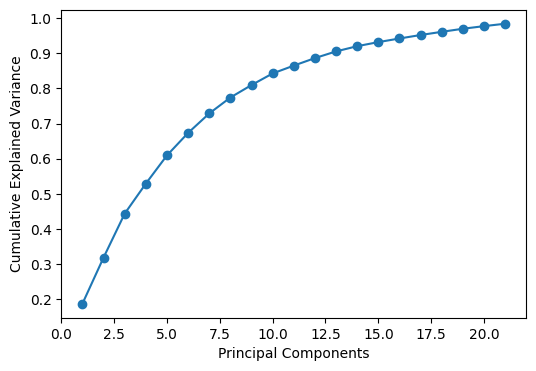

Number of components retained for 80% variance: 9
=== PCA Summary ===
Component  Explained Variance (%)  Cumulative Variance (%)
      PC1                   18.73                    18.73
      PC2                   13.13                    31.86
      PC3                   12.50                    44.36
      PC4                    8.54                    52.89
      PC5                    8.03                    60.93
      PC6                    6.40                    67.32
      PC7                    5.53                    72.85
      PC8                    4.54                    77.39
      PC9                    3.55                    80.94
     PC10                    3.31                    84.24
     PC11                    2.22                    86.46
     PC12                    2.14                    88.61
     PC13                    1.90                    90.51
     PC14                    1.49                    92.00
     PC15                    1.16            

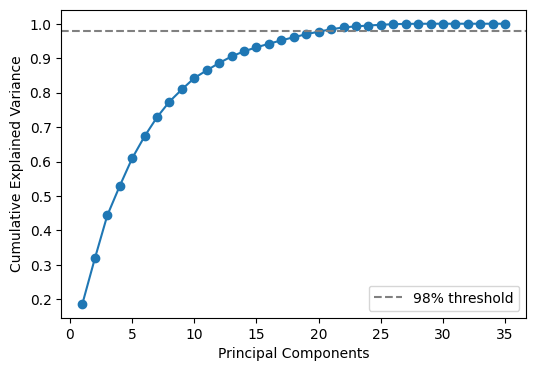

PC 1: explained variance = 18.73%  |  cumulative variance = 18.73%
PC 2: explained variance = 13.13%  |  cumulative variance = 31.86%
PC 3: explained variance = 12.50%  |  cumulative variance = 44.36%
PC 4: explained variance = 8.54%  |  cumulative variance = 52.89%
PC 5: explained variance = 8.03%  |  cumulative variance = 60.93%
PC 6: explained variance = 6.40%  |  cumulative variance = 67.32%
PC 7: explained variance = 5.53%  |  cumulative variance = 72.85%
PC 8: explained variance = 4.54%  |  cumulative variance = 77.39%
PC 9: explained variance = 3.55%  |  cumulative variance = 80.94%
PC10: explained variance = 3.31%  |  cumulative variance = 84.24%
PC11: explained variance = 2.22%  |  cumulative variance = 86.46%
PC12: explained variance = 2.14%  |  cumulative variance = 88.61%
PC13: explained variance = 1.90%  |  cumulative variance = 90.51%
PC14: explained variance = 1.49%  |  cumulative variance = 92.00%
PC15: explained variance = 1.16%  |  cumulative variance = 93.15%
PC16: e

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import numpy as np

X = df_shuffled.drop(["type", "n_corners_shi", "corner_density_shi"], axis=1)
y = df_shuffled["type"]
features = X.columns.tolist()

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=0.98, random_state=42)
X_pca = pca.fit_transform(X_scaled)

import matplotlib.pyplot as plt
plt.figure(figsize=(6,4))
plt.plot(
    np.arange(1, len(pca.explained_variance_ratio_)+1),
    pca.explained_variance_ratio_.cumsum(), marker='o'
)
plt.xlabel("Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.show()

pca8 = PCA(n_components=8)
X_reduced_8 = pca8.fit_transform(X_scaled)

pca_var80 = PCA(n_components=0.80)
X_reduced_var80 = pca_var80.fit_transform(X_scaled)

print("Number of components retained for 80% variance:", pca_var80.n_components_)

var_ratio = pca.explained_variance_ratio_
cum_var   = var_ratio.cumsum()
pcs       = [f"PC{i}" for i in range(1, len(var_ratio)+1)]

summary_df = pd.DataFrame({
    "Component": pcs,
    "Explained Variance (%)": (var_ratio * 100).round(2),
    "Cumulative Variance (%)": (cum_var  * 100).round(2)
})
print("=== PCA Summary ===")
print(summary_df.to_string(index=False))

loadings = pd.DataFrame(
    pca.components_.T,
    index=features,
    columns=pcs
)

print("\n=== Top 5 variables per component ===")
for pc in pcs:
    top5 = loadings[pc].abs().sort_values(ascending=False).head(5).index
    coeffs = loadings.loc[top5, pc].round(3)
    pairs  = [f"{feat} ({coeffs[feat]})" for feat in top5]
    print(f"{pc}: {', '.join(pairs)}")

pca_full = PCA(random_state=42)
X_full = pca_full.fit_transform(X_scaled)

plt.figure(figsize=(6,4))
plt.plot(
    np.arange(1, len(pca_full.explained_variance_ratio_)+1),
    pca_full.explained_variance_ratio_.cumsum(), marker='o'
)
plt.axhline(0.98, linestyle='--', color='gray', label='98% threshold')
plt.xlabel("Principal Components")
plt.ylabel("Cumulative Explained Variance")
plt.legend()
plt.show()

var_ratio_full = pca_full.explained_variance_ratio_
cum_var_full = var_ratio_full.cumsum()

for i, (vr, cv) in enumerate(zip(var_ratio_full, cum_var_full), start=1):
    print(f"PC{i:2d}: explained variance = {vr*100:.2f}%  |  cumulative variance = {cv*100:.2f}%")

#Klasifikasi

##SVM

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report

X = df_shuffled.drop(["type", "n_corners_shi", "corner_density_shi"], axis=1)
y = df_shuffled["type"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

pca = PCA(n_components=25)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

svm_model = SVC(kernel='rbf', random_state=42)
svm_model.fit(X_train_pca, y_train)

y_pred = svm_model.predict(X_test_pca)
print("SVM Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

SVM Accuracy: 0.8685185185185185

Classification Report:
               precision    recall  f1-score   support

         1.0       0.81      0.78      0.80       175
         2.0       0.91      0.97      0.94       200
         3.0       0.87      0.84      0.85       165

    accuracy                           0.87       540
   macro avg       0.86      0.86      0.86       540
weighted avg       0.87      0.87      0.87       540



In [ ]:
comparison_df = pd.DataFrame({
    'Original': y_test,
    'SVM Prediction': y_pred
})

print(comparison_df.head(20))

    Original  SVM Prediction
0          0               0
1          2               2
2          1               1
3          2               2
4          1               1
5          1               1
6          0               0
7          1               1
8          0               0
9          1               1
10         1               1
11         2               2
12         1               1
13         2               2
14         1               1
15         2               2
16         1               1
17         2               2
18         0               0
19         1               0


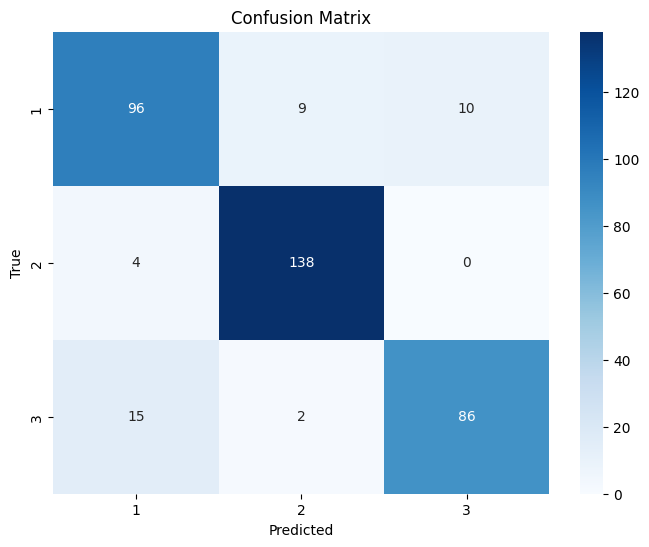

In [ ]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=[1, 2, 3], yticklabels=[1, 2, 3])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

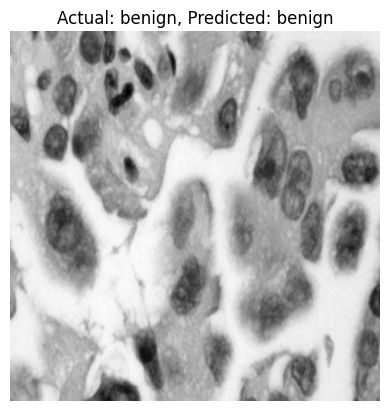

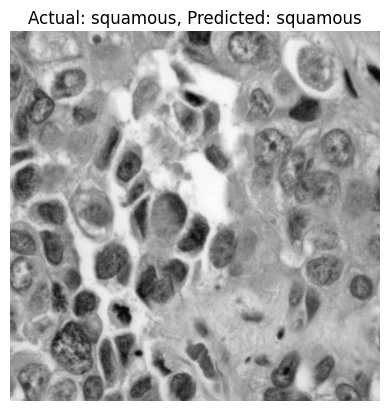

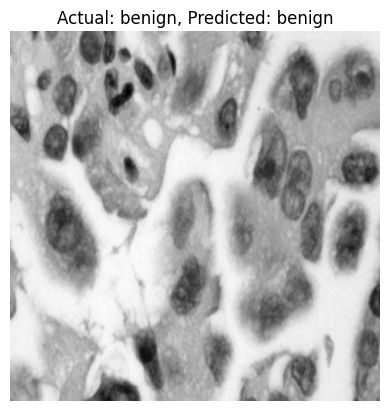

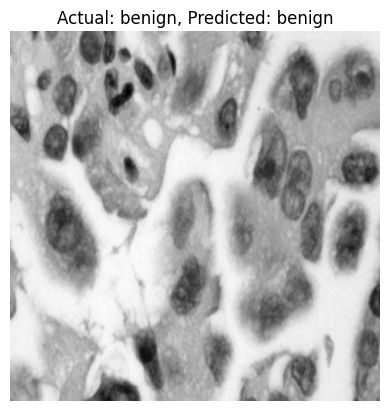

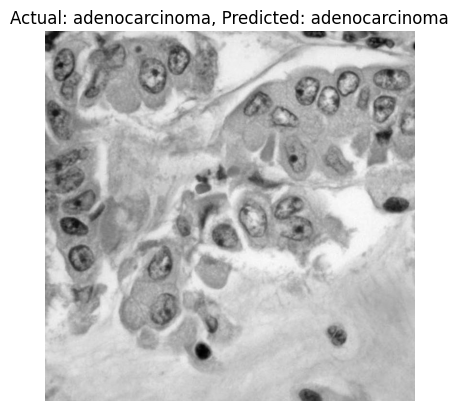

...

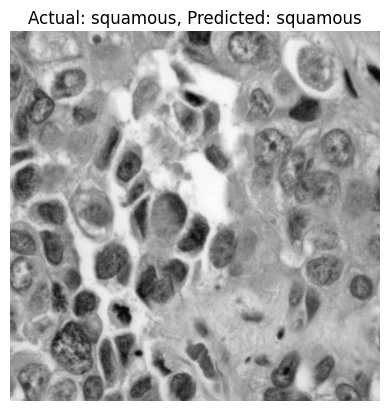

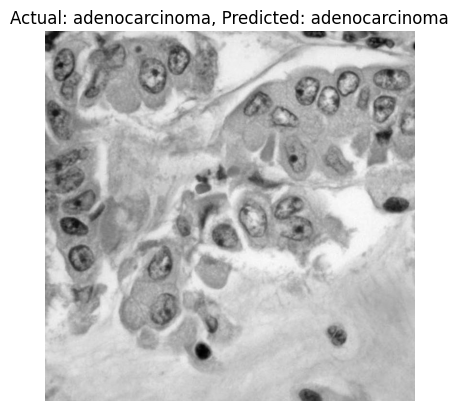

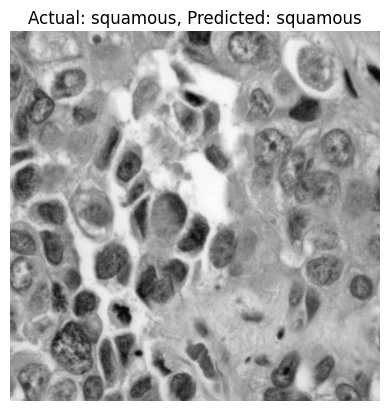

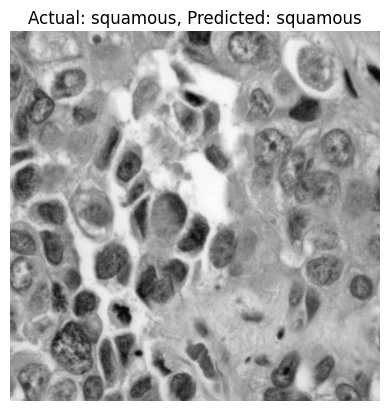

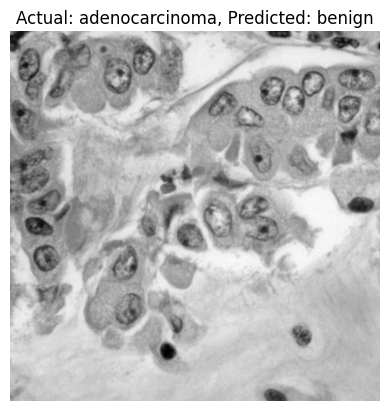

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import confusion_matrix

comparison_df = pd.DataFrame({
    'Actual': y_test,
    'Predicted': y_pred
})

class_names = {
    0: "benign",
    1: "adenocarcinoma",
    2: "squamous"
}

def compare_images(image_path, actual_label, predicted_label):
    actual_class_name = class_names.get(actual_label)
    predicted_class_name = class_names.get(predicted_label)

    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    plt.imshow(image, cmap='gray')
    plt.title(f"Actual: {actual_class_name}, Predicted: {predicted_class_name}")
    plt.axis('off')
    plt.show()

adenocarcinoma_images = [os.path.join('lung_cancer_data/adenocarcinoma', f) for f in os.listdir('lung_cancer_data/adenocarcinoma') if f.endswith('.jpg')]
benign_images = [os.path.join('lung_cancer_data/benign', f) for f in os.listdir('lung_cancer_data/benign') if f.endswith('.jpg')]
squamous_images = [os.path.join('lung_cancer_data/squamous_cell_carcinoma', f) for f in os.listdir('lung_cancer_data/squamous_cell_carcinoma') if f.endswith('.jpg')]

all_image_paths = adenocarcinoma_images + benign_images + squamous_images

y_original = df_shuffled["type"].values
image_path_mapping = {i: path for i, path in enumerate(all_image_paths)}

for index, row in comparison_df.sample(20).iterrows():
    original_index = y_original.tolist().index(y_test[index] + 1)
    image_path = image_path_mapping.get(original_index)

    if image_path:
        compare_images(image_path, row['Actual'], row['Predicted'])

#Metode klasifikasi lainnya

##Random Forest

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report

X = df_shuffled.drop(["type", "n_corners_shi", "corner_density_shi"], axis=1)
y = df_shuffled["type"]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

pca = PCA(n_components=25)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)

rf_model = RandomForestClassifier(n_estimators=110, random_state=42)
rf_model.fit(X_train_pca, y_train)

y_pred_rf = rf_model.predict(X_test_pca)

print("Random Forest Accuracy:", accuracy_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))

Random Forest Accuracy: 0.837037037037037

Classification Report:
               precision    recall  f1-score   support

         1.0       0.77      0.72      0.75       175
         2.0       0.91      0.95      0.93       200
         3.0       0.81      0.82      0.82       165

    accuracy                           0.84       540
   macro avg       0.83      0.83      0.83       540
weighted avg       0.83      0.84      0.84       540



##XGBoost

In [ ]:
!pip install xgboost

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

X = df_shuffled.drop(["type", "n_corners_shi", "corner_density_shi"], axis=1)
y = df_shuffled["type"]

encoder = LabelEncoder()
y_encoded = encoder.fit_transform(y)


X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

pca = PCA(n_components=30, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca  = pca.transform(X_test_scaled)


xgb_model = XGBClassifier(eval_metric='mlogloss', random_state=42)
xgb_model.fit(X_train_pca, y_train)

y_pred = xgb_model.predict(X_test_pca)

print("XGBoost Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=encoder.classes_.astype(str)))

XGBoost Accuracy: 0.8888888888888888

Classification Report:
               precision    recall  f1-score   support

         1.0       0.83      0.83      0.83       115
         2.0       0.93      0.97      0.95       142
         3.0       0.90      0.83      0.86       103

    accuracy                           0.89       360
   macro avg       0.89      0.88      0.88       360
weighted avg       0.89      0.89      0.89       360

